# SEG Bootcamp - first-look data analysis for shot recordings

This notebook contains basic data visualization and analysis of the data collected with Stryde nodes at KAUST during the SEG Student Chapter bootcamp on Nov 7 2023.

The dataset is acquired as follows:

- <font color='blue'>Receivers</font>

    1 line of 89 buried receivers, equally spaced by 2m for a total lenght of 178m.

    1 receiver placed near (and following) the source  (this is the last of each shot gather)

- <font color='red'>Sources</font>

    9 sources on the right side of the receiver line at Point 2001, 2010, 2019, 2028, 2037, 2046, 2055, 2064, 2073, 2082 (18m distance)

    10 shots per source

In [18]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pylops
import matplotlib.pyplot as plt

from matplotlib.colors import SymLogNorm
from pylops.signalprocessing import FFT2D

from pystryde.reader import *
from pystryde.preproc import *
from pystryde.cmap import cmaps
from pystryde.visual import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Single shot

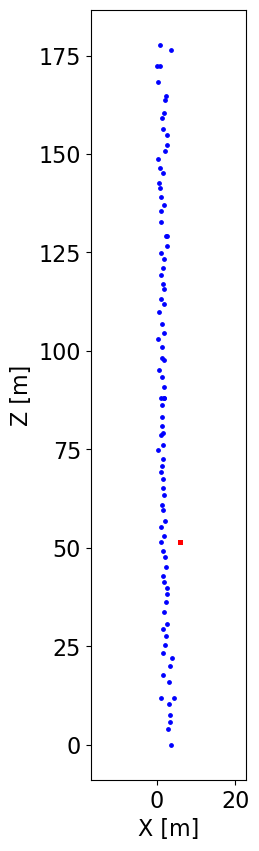

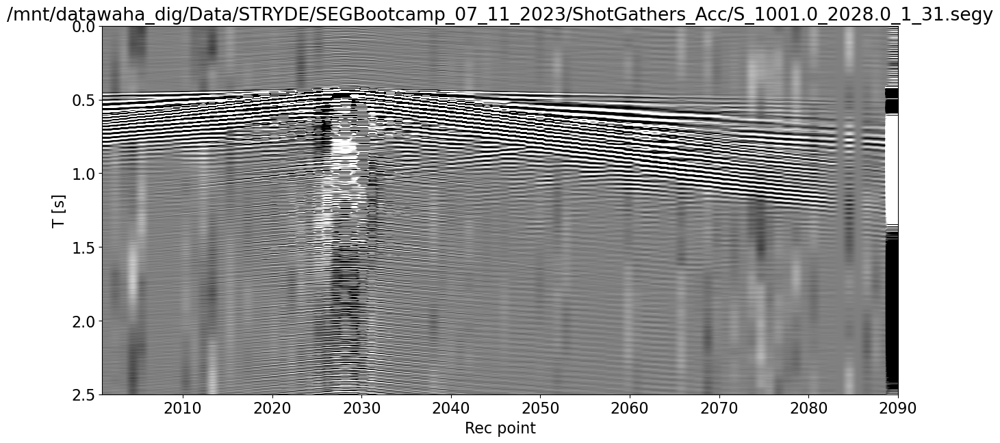

In [19]:
# SINGLE SHOT
filename = '/mnt/datawaha_dig/Data/STRYDE/SEGBootcamp_07_11_2023/ShotGathers_Acc/S_1001.0_2028.0_1_31.segy'
f = strydeshot(filename)
f.interpret()
f.getshot()
f.recx = f.recx.astype(np.float32)
f.recy = f.recy.astype(np.float32)
f.recx[f.recx==0] = np.nan
f.recx[np.isnan(f.recx)] = np.nanmean(f.recx)
f.recy[f.recy==0] = np.nan
f.recy[np.isnan(f.recy)] = np.nanmean(f.recy)

fig, ax = f.plotgeom(local=True, figsize=(2, 10))
ax.axis('equal')
plt.savefig('Figs/localgeometry.png', dpi=200, bbox_inches="tight")

f.plotshot(figsize=(15,7), itmax=2500, cmap='gray', clip=1e-3)
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}.png", dpi=200);

Let's now perform some basic filtering

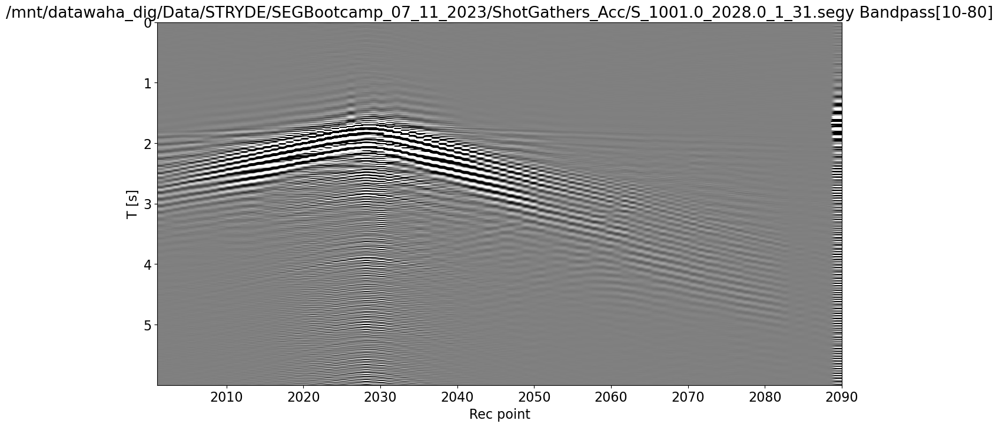

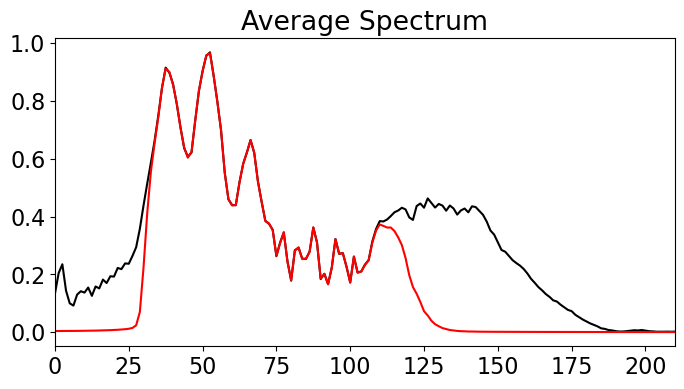

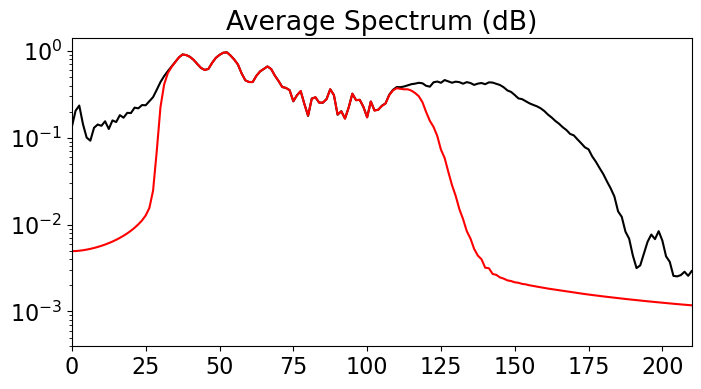

In [20]:
dfilt = f.filter(11, 30, 120, f.dt, plotflag=True, itmax_plot=1500, title=filename + ' Bandpass[10-80]',
                 cmap='gray', vmin=-1e-2, vmax=1e-2, figsize=(15, 8),
                 extent=(f.recpoint[0], f.recpoint[-1], f.t[-1], f.t[0]))
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}_filtered.png", dpi=200);

D, freq = averagespectrum(f.data[:, :800].T, f.dt)
Dfilt, freq = averagespectrum(dfilt[:, :800].T, f.dt)

plt.figure(figsize=(8, 4))
plt.plot(freq, np.abs(D), 'k')
plt.plot(freq, np.abs(Dfilt), 'r')
plt.title('Average Spectrum')
plt.xlim(0, 210)
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}_avspectrum.png", dpi=200)

plt.figure(figsize=(8, 4))
plt.semilogy(freq, np.abs(D), 'k')
plt.semilogy(freq, np.abs(Dfilt), 'r')
plt.title('Average Spectrum (dB)')
plt.xlim(0, 210)
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}_avspectrumdb.png", dpi=200);

## Entire survey

Data shape: (10, 1, 10, 90, 6000)


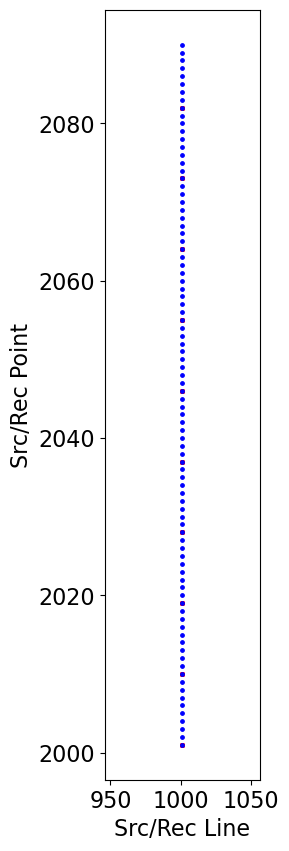

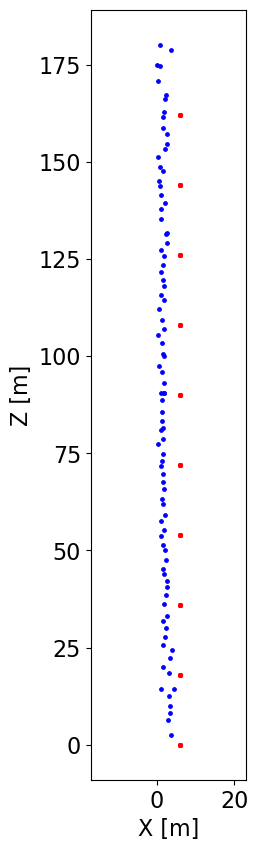

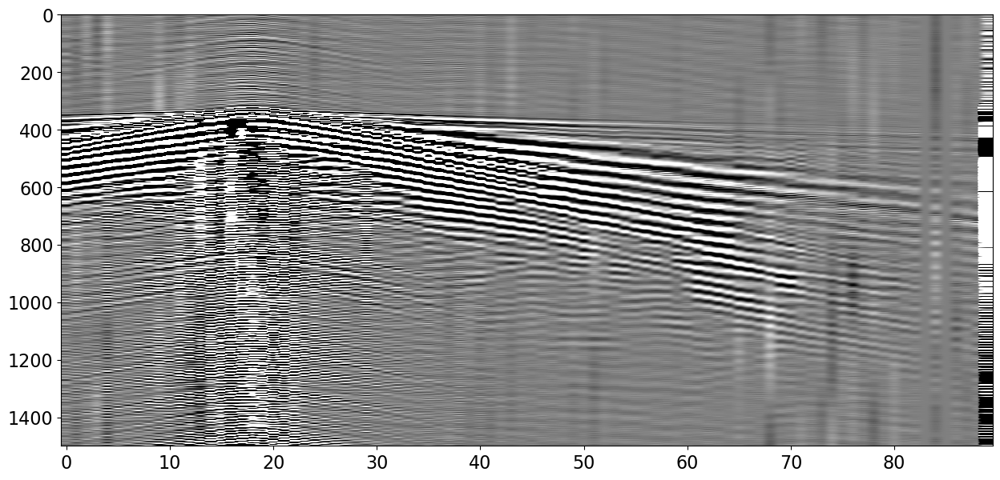

In [21]:
fs = strydeshots('/mnt/datawaha_dig/Data/STRYDE/SEGBootcamp_07_11_2023/ShotGathers_Acc/')
fs.interpret()
fs.getshot()

fs.recx = fs.recx.astype(np.float32)
fs.recy = fs.recy.astype(np.float32)
fs.recx[fs.recx==0] = np.nan
fs.recx[np.isnan(fs.recx)] = np.nanmean(fs.recx)
fs.recy[fs.recy==0] = np.nan
fs.recy[np.isnan(fs.recy)] = np.nanmean(fs.recy)

print('Data shape:', fs.data.shape)

fs.plotgeom(coords=False, figsize=(2, 10))
fig, ax = fs.plotgeom(local=True, figsize=(2, 10))
ax.axis('equal')
plt.savefig('Figs/localsurveygeometry.png', dpi=200)

plt.figure(figsize=(15,7))
plt.imshow(fs.data[0, 0, 2, :, :1500].T, cmap='gray', vmin=-1e-3, vmax=1e-3)
plt.axis('tight');

### Improve data alignment via cross-correlation

Let's start with a single shot location. We will use the traces at the closest receiver to find the best alignment

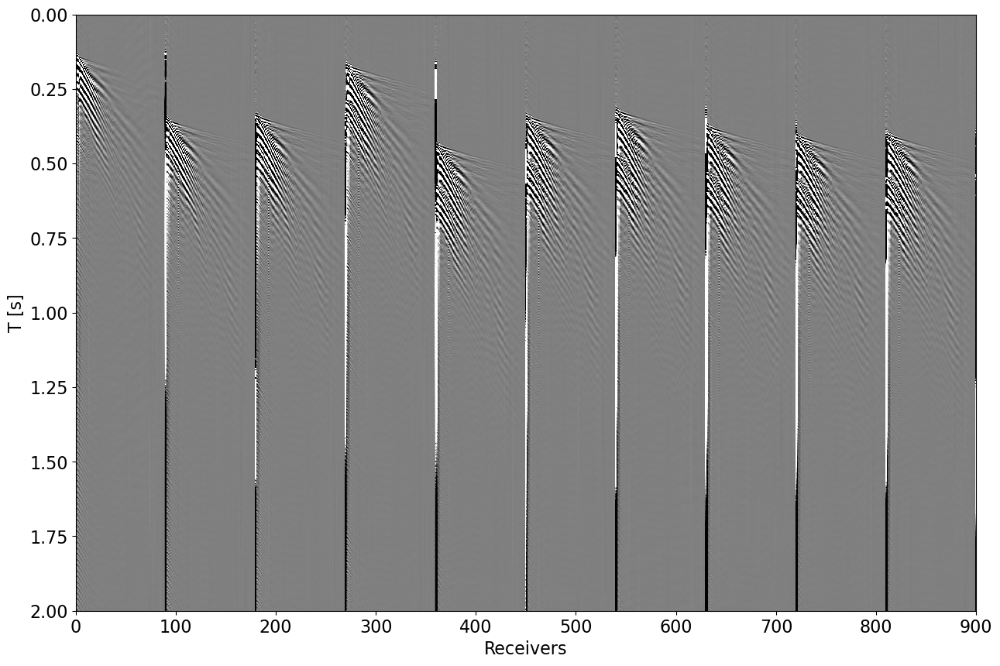

In [22]:
ishot = 0
data = fs.data

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.imshow(data[:, 0, ishot].reshape(-1, fs.nt).T, 
          cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, 90*10, fs.t[-1], 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_ylim(2., 0);

Indices of max aligment: [379 391 561 295 390 409 357 326]


Indices of max aligment after shifts: [379 379 379 379 379 379 379 379]


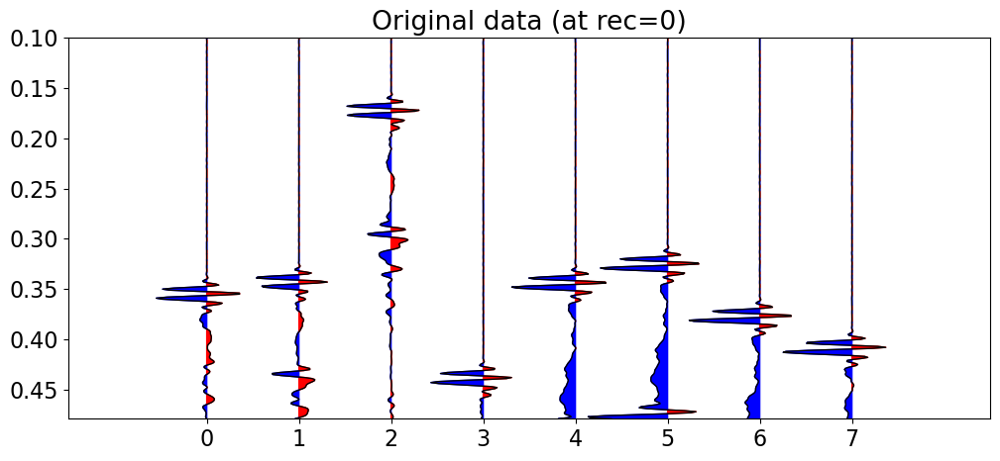

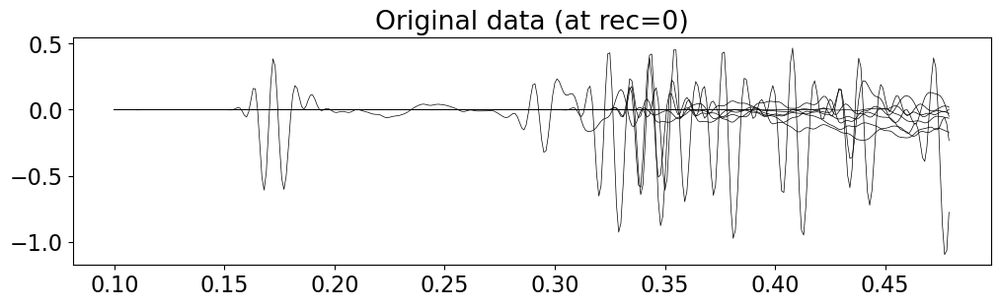

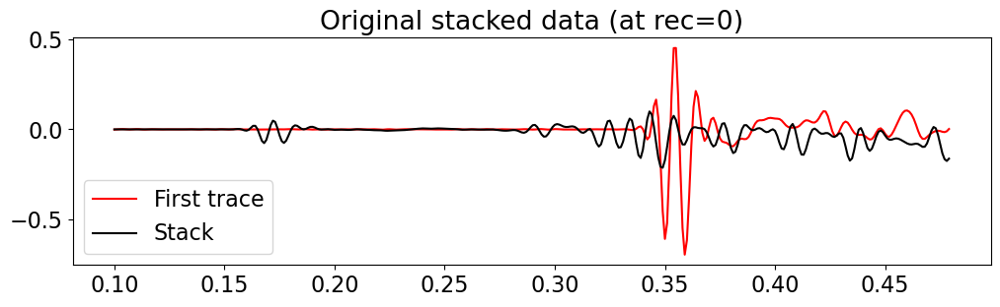

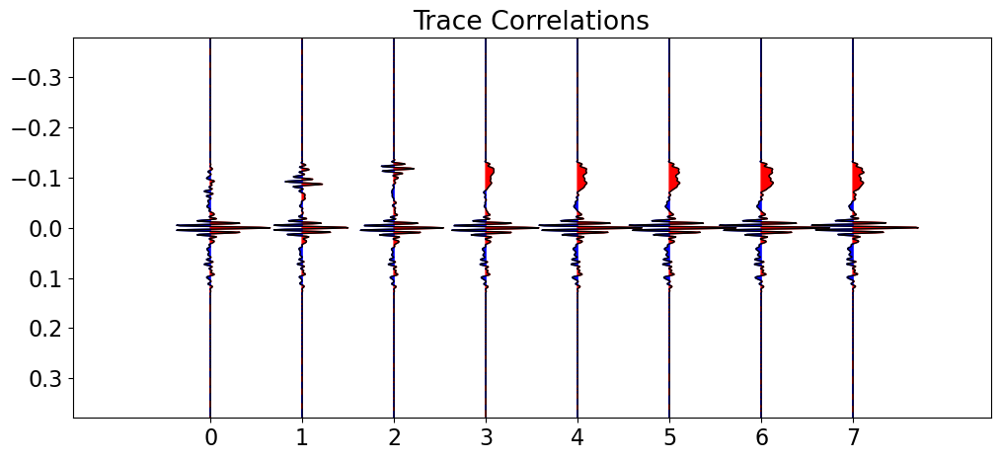

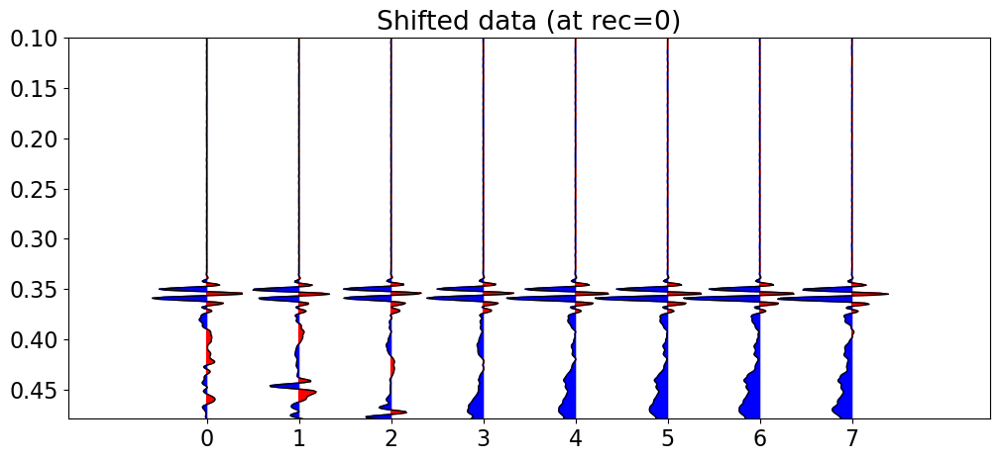

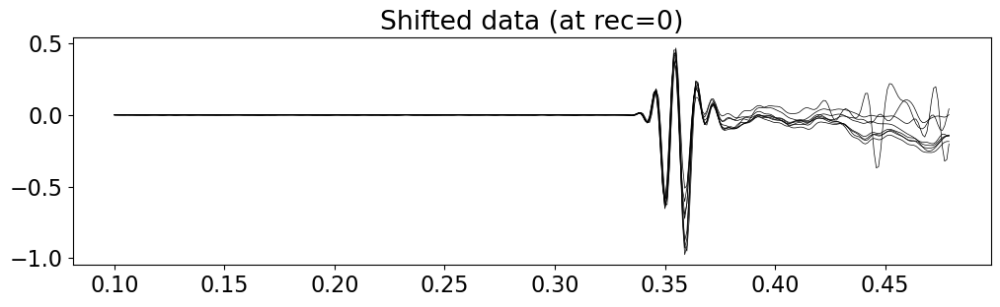

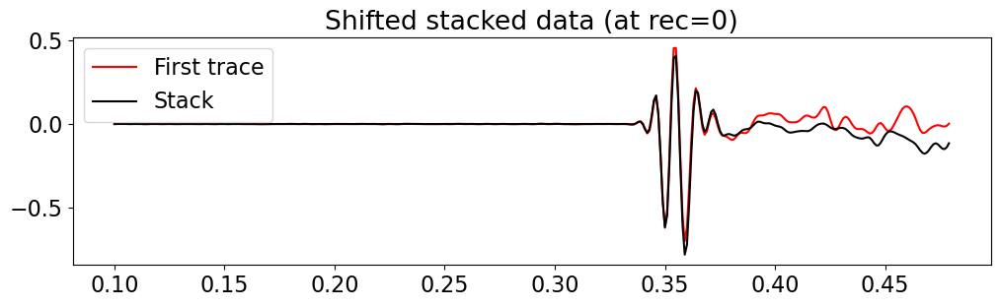

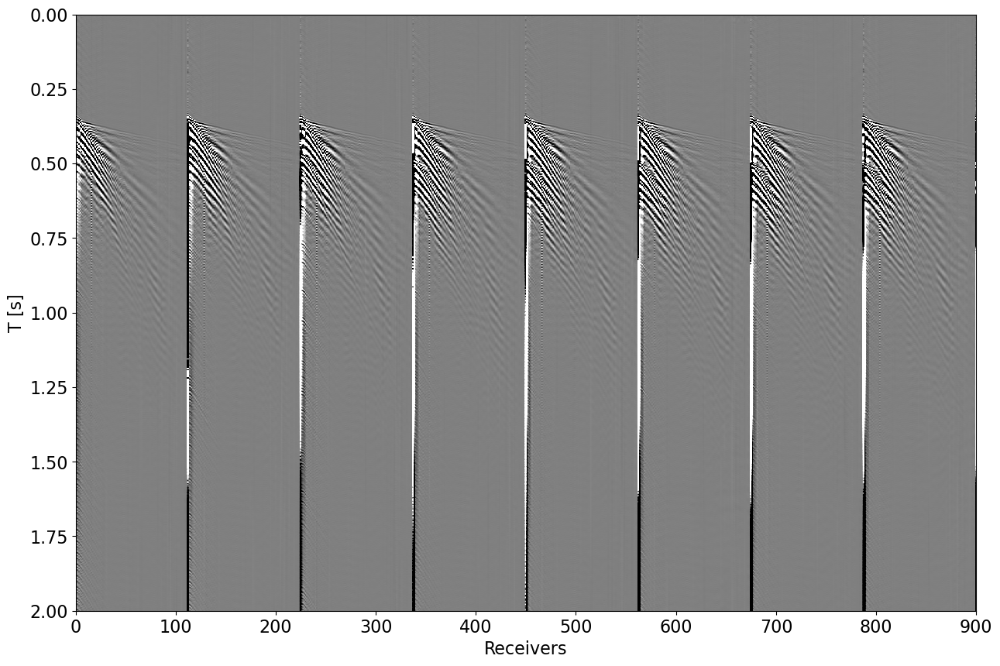

In [23]:
ishot = 0
data = fs.data[1:-1]
datashift, figs = aligndata(data[:, 0, ishot], np.where(fs.recpoint == fs.srcpoint_axis[ishot])[0][0]  , fs.t, 
                            tlims=(100, 480), plotflag=True)
figs[0].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal.png", dpi=200)
figs[1].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal_traceoverlay.png", dpi=200)
figs[2].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal_traceoverlay1.png", dpi=200)
figs[3].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrs.png", dpi=200)
figs[4].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected.png", dpi=200)
figs[5].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected_traceoverlay.png", dpi=200)
figs[6].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected_traceoverlay1.png", dpi=200)

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.imshow(datashift.reshape(-1, fs.nt).T, 
          cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, 90*10, fs.t[-1], 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_ylim(2., 0);

Let's then do the same for all shots

In [24]:
datashift = np.zeros_like(data)
tlims=[(100, 480), (200, 600), (200, 600), (200, 600), (200, 600), (200, 600), (200, 600), (200, 600), (200, 600), (200, 600)]

for ishot in range(len(fs.srcpoint_axis)):
    print(f'Working with shot {ishot}')
    datashift[:, 0, ishot] = aligndata(data[:, 0, ishot], 
                                       np.where(fs.recpoint == fs.srcpoint_axis[ishot])[0][0], 
                                       fs.t, tlims=tlims[ishot], plotflag=False)[0]
    
datashiftstacked = np.mean(datashift.squeeze(), axis=0)

Working with shot 0
Indices of max aligment: [379 391 561 295 390 409 357 326]
Indices of max aligment after shifts: [379 379 379 379 379 379 379 379]
Working with shot 1
Indices of max aligment: [399 403 340 343 372 402 292 379]
Indices of max aligment after shifts: [399 399 399 399 399 399 399 399]
Working with shot 2
Indices of max aligment: [399 478 521 449 436 426 348 274]
Indices of max aligment after shifts: [399 399 399 399 399 399 399 399]
Working with shot 3
Indices of max aligment: [399 405 399 471 343 386 269 380]
Indices of max aligment after shifts: [399 399 399 399 399 399 399 399]
Working with shot 4
Indices of max aligment: [399 386 339 383 334 375 294 273]
Indices of max aligment after shifts: [399 399 399 399 399 399 399 399]
Working with shot 5
Indices of max aligment: [399 351 314 312 396 263 338 376]
Indices of max aligment after shifts: [399 399 399 399 399 399 399 399]
Working with shot 6
Indices of max aligment: [399 363 362 410 441 414 330 327]
Indices of max 

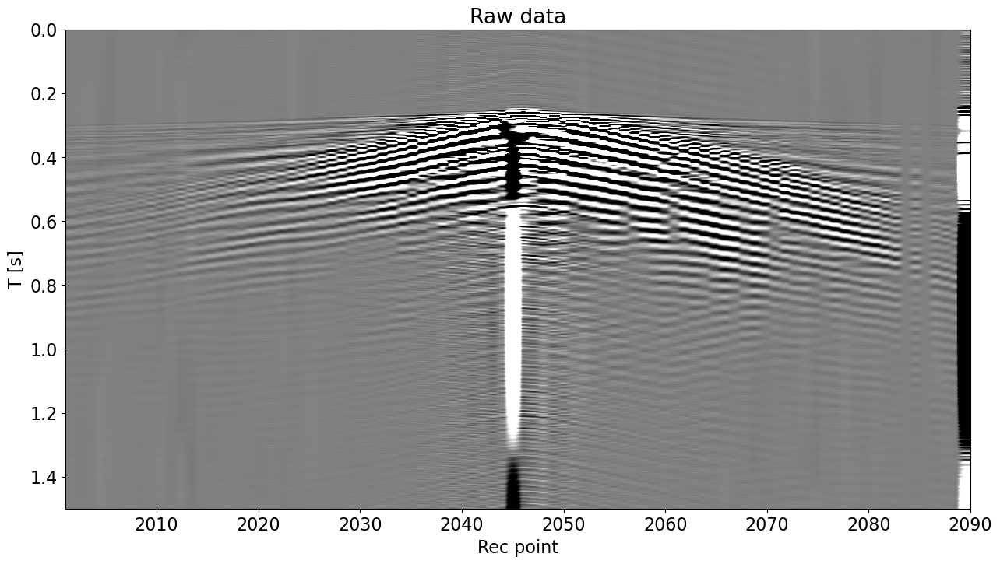

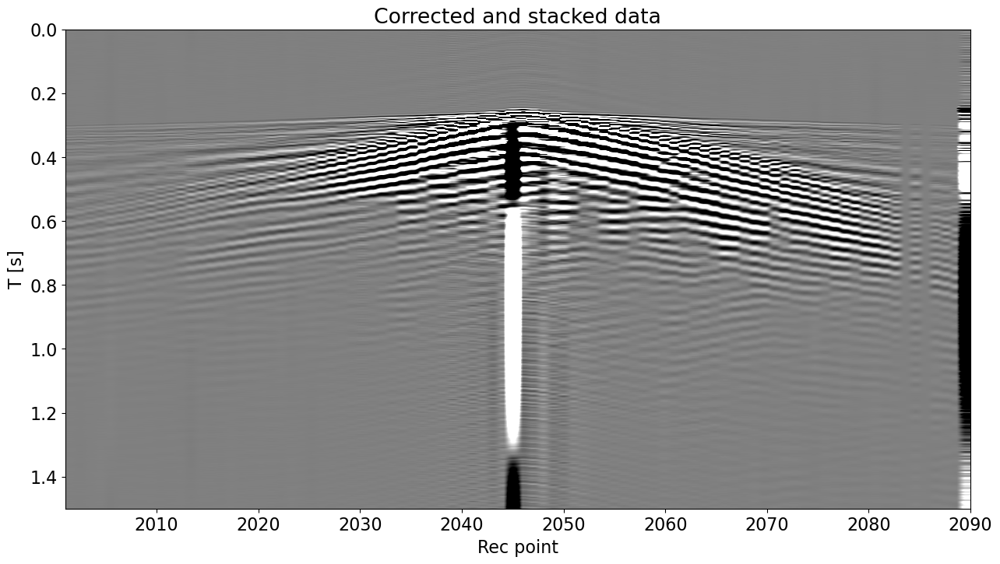

In [25]:
ishot = 5
itmax = 1500

plt.figure(figsize=(15, 8))
plt.imshow(data[0, 0, ishot, :, :itmax].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Raw data')
plt.savefig(f"Figs/Rawdata_shot{ishot}.png", dpi=200)

plt.figure(figsize=(15, 8))
plt.imshow(datashiftstacked[ishot, :, :itmax].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Corrected and stacked data')
plt.savefig(f"Figs/OptimalStackeddata_shot{ishot}.png", dpi=200);

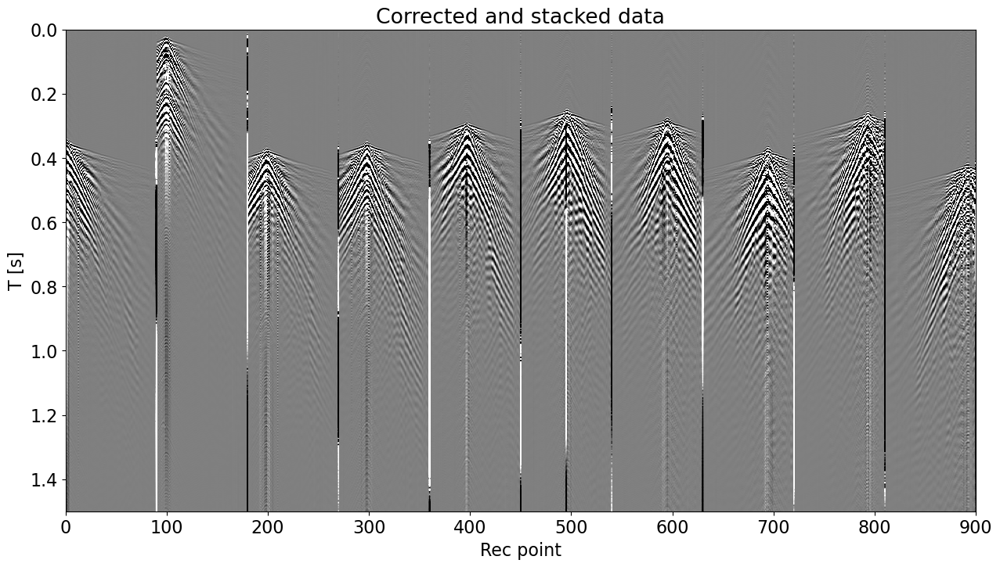

In [26]:
itmax = 1500
plt.figure(figsize=(15, 8))
plt.imshow(datashiftstacked.reshape(-1, fs.nt)[:, :itmax].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(0, datashiftstacked.shape[0]*datashiftstacked.shape[1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Corrected and stacked data');

Finally, we align manually to absolute t0

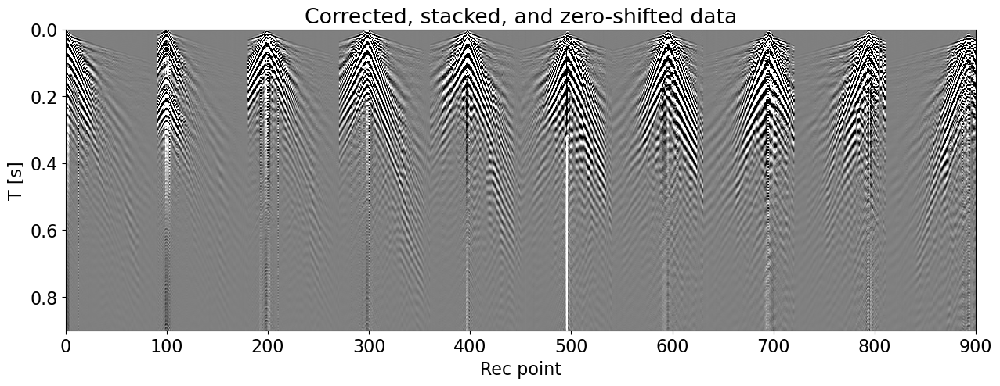

In [27]:
t0s = [0.335, 0.02, 0.365, 0.35, 0.285, 0.24, 0.27, 0.36, 0.25, 0.40,]
nt = 900
datafinal = np.concatenate([dat[:, int(t0 // fs.dt):][np.newaxis, :, :nt] for dat, t0 in zip(datashiftstacked, t0s)])
datafinal = datafinal[:, :89]

plt.figure(figsize=(15, 5))
plt.imshow(datafinal.reshape(-1, nt).T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(0, datashiftstacked.shape[0]*datashiftstacked.shape[1], f.t[nt], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Corrected, stacked, and zero-shifted data')
plt.savefig(f"Figs/OptimalStackeddata_shot{ishot}.png", dpi=200)

# Save data
np.savez('Data_final_SEGbootcamp', data=datafinal, t = np.arange(nt)*fs.dt, recx = np.arange(89) * 2)

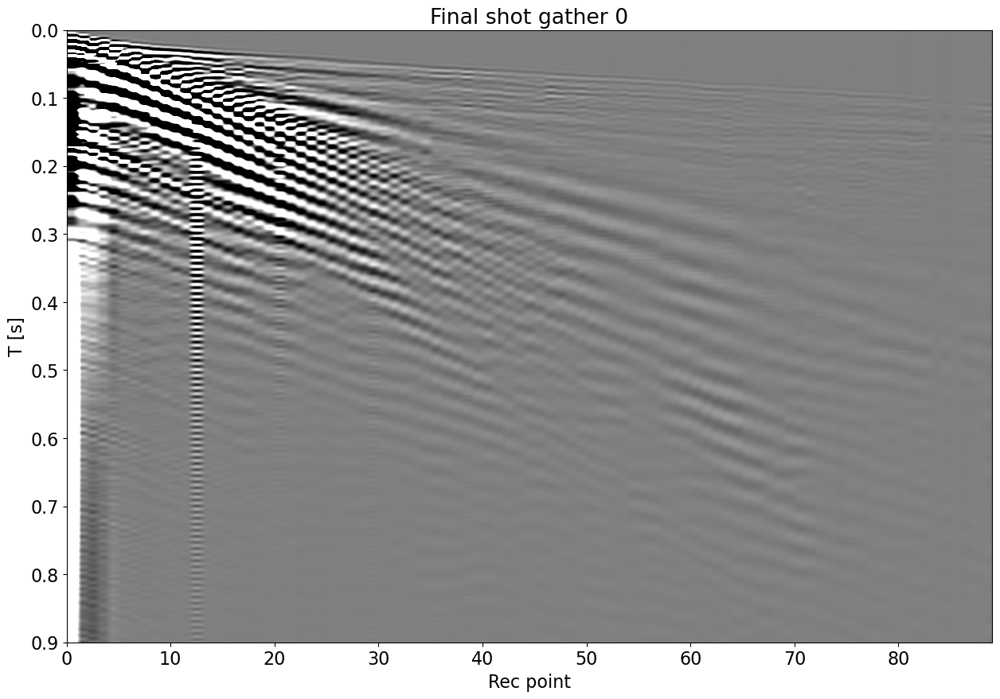

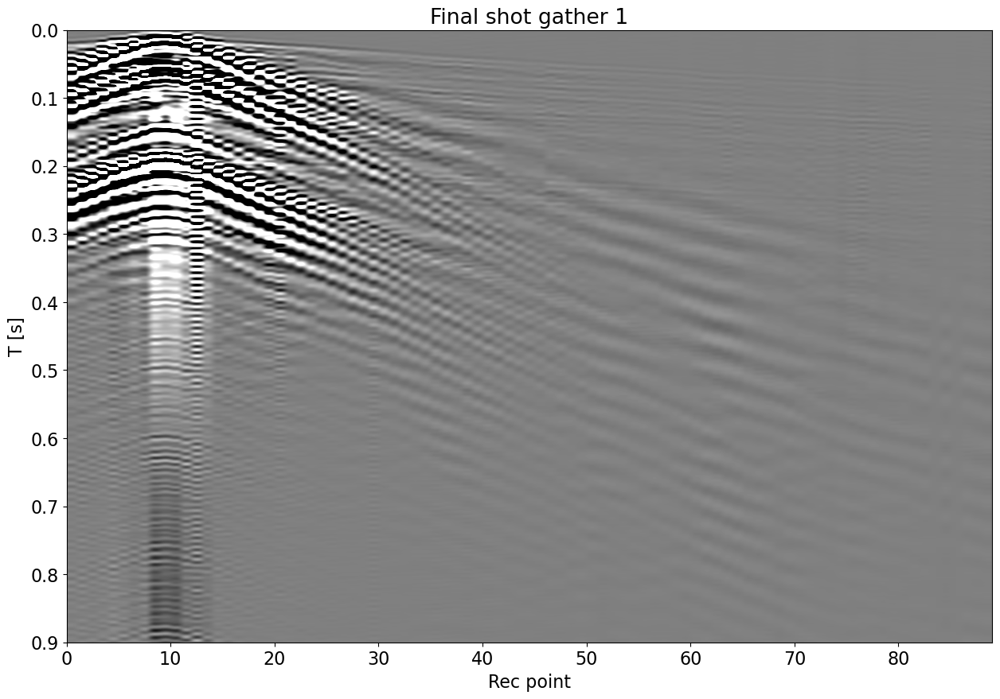

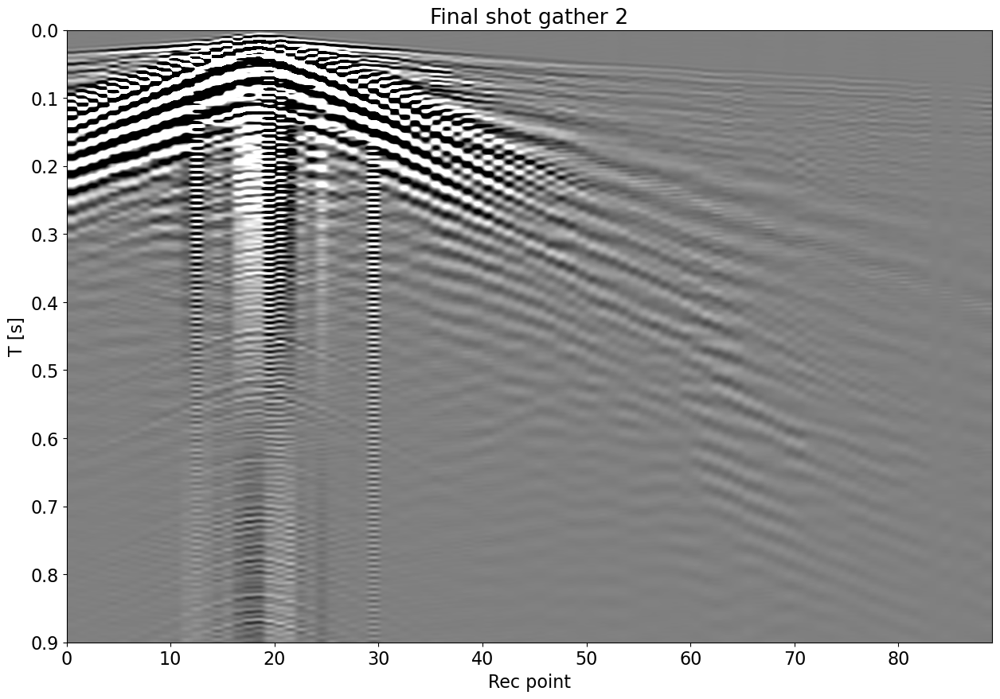

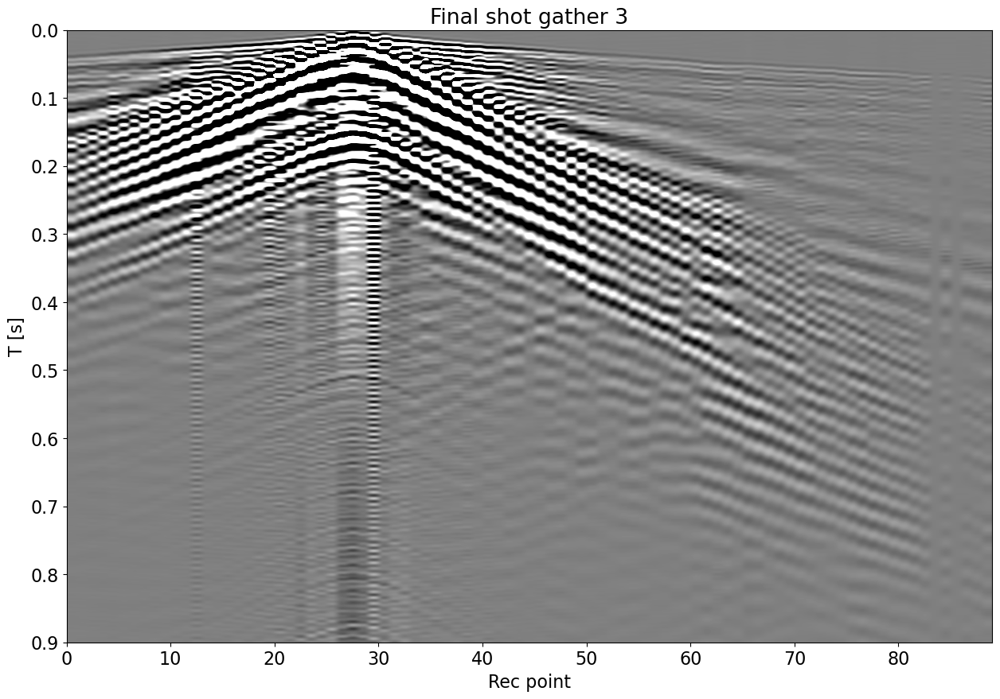

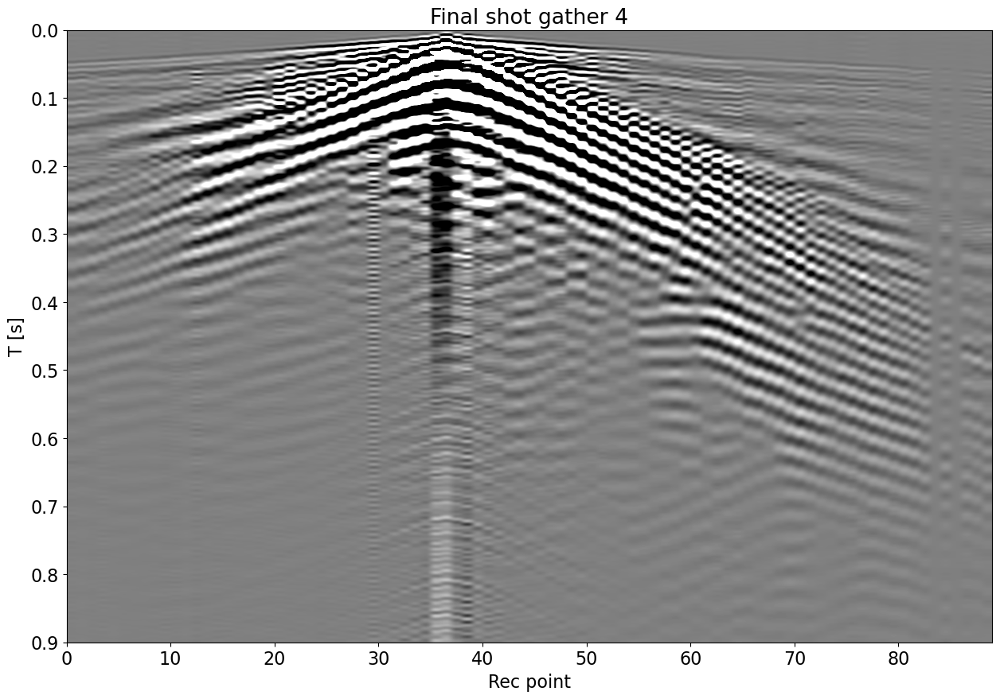

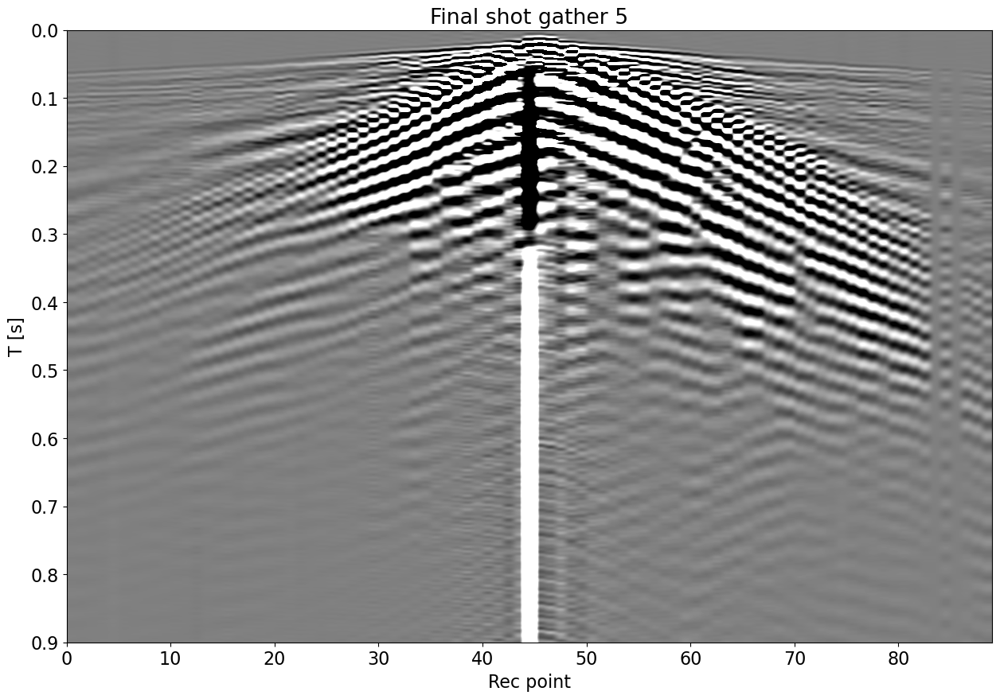

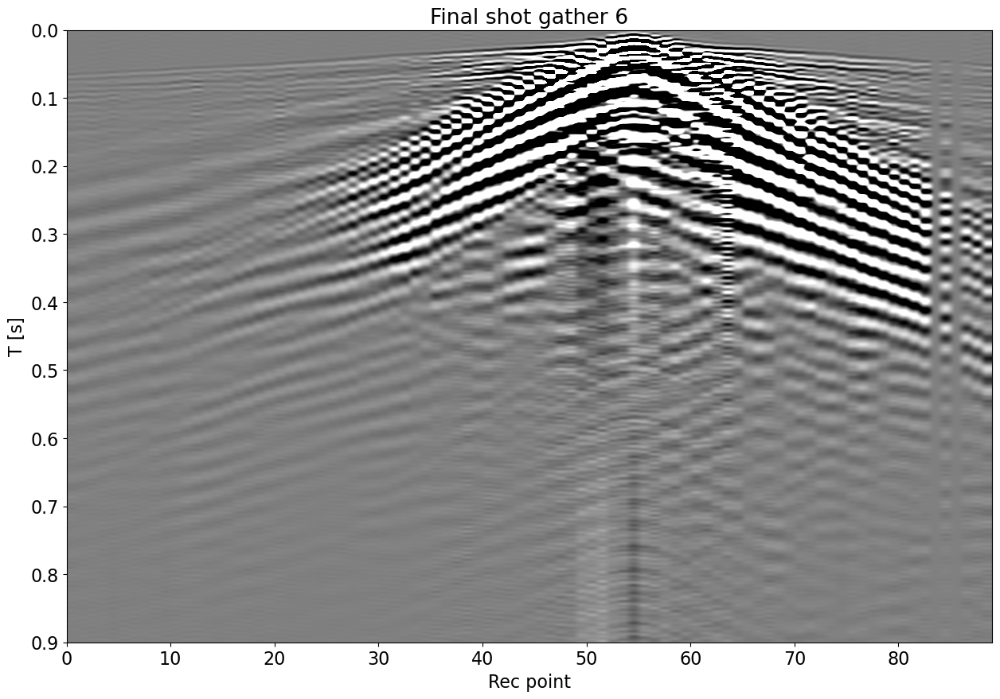

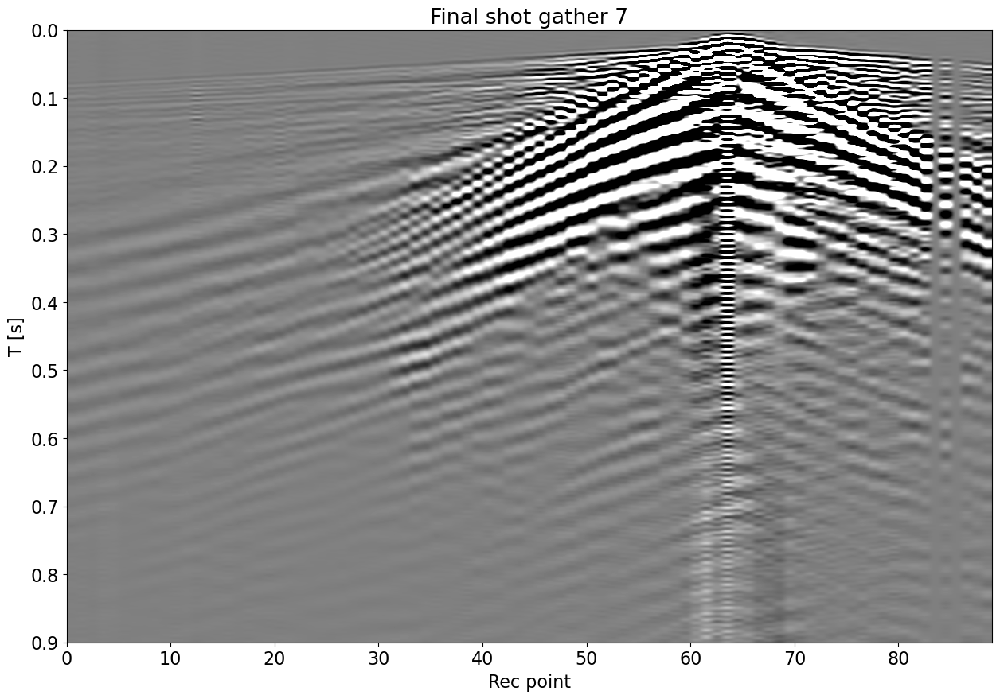

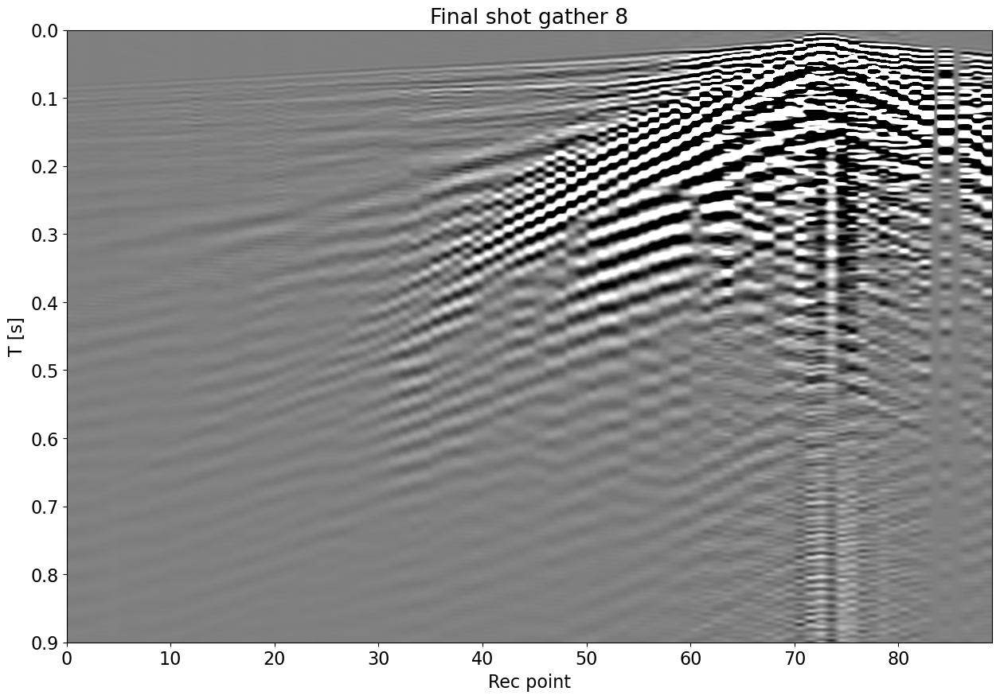

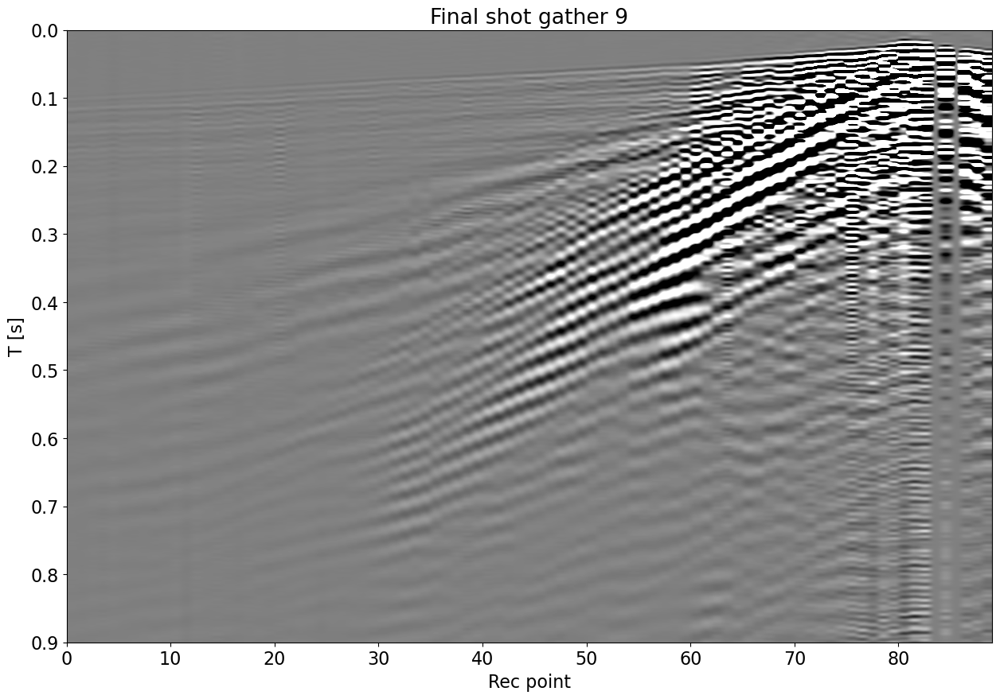

In [28]:
nr = datafinal[0].shape[0]
for ishot in range(datafinal.shape[0]):
    datanorm = datafinal[ishot]
    datanorm.max()
    plt.figure(figsize=(15, 10))
    plt.imshow(datafinal[ishot].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
            extent=(0, nr, f.t[nt], f.t[0]))
    plt.axis('tight')
    plt.xlabel('Rec point')
    plt.ylabel('T [s]')
    plt.title(f'Final shot gather {ishot}')
    plt.savefig(f"Figs/OptimalStackeddata_shot{ishot}.png", dpi=200);

## Bandpass data

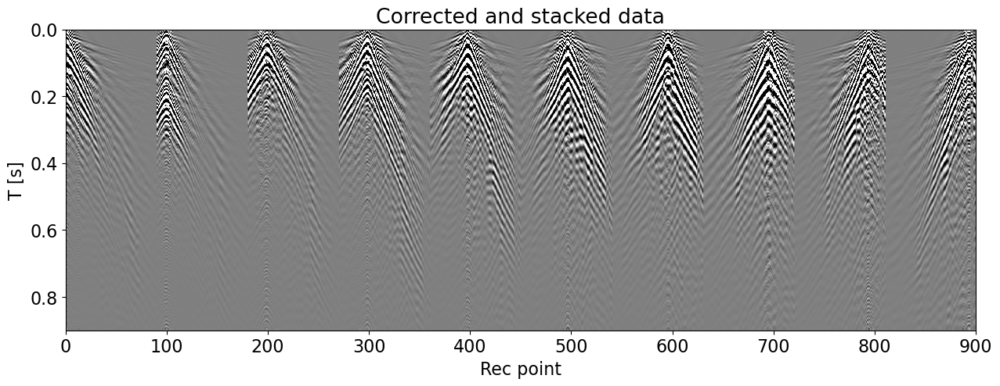

In [29]:
datafilt = np.concatenate([filterdata(11, 20, 110, fs.dt, np.pad(datafinal[ishot], ((0,0),(200,0))))[-1][:, 200:][np.newaxis] for ishot in range(datafinal.shape[0])])

plt.figure(figsize=(15, 5))
plt.imshow(datafilt.reshape(-1, nt).T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(0, datashiftstacked.shape[0]*datashiftstacked.shape[1], f.t[nt], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Corrected and stacked data')
plt.savefig(f"Figs/OptimalStackedFiltereddata_shot.png", dpi=200);

## FK spectra

In [30]:
ishot = 4
itmax = nt
nfft = 2**10
toff = 0.02
drx = 2

offset = np.arange(nr) * drx - np.where(fs.recpoint == fs.srcpoint_axis[ishot])[0][0] * drx

# direct arrival
vdir = 2000
tdir = np.abs(offset)/vdir

# ground rool arrival
vgr = 250
tgr = np.abs(offset)/vgr

# fft 
FFTop = FFT2D(dims=[89, nt], nffts=[nfft, nfft],
              sampling=[dx, fs.dt], real=True)
              
Dfk = FFTop @ datafinal[ishot, :, :itmax]

fig, axs = plt.subplots(1, 2, figsize=(13, 7))
axs[0].imshow(datafinal[ishot, :-1, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].plot(offset, tdir, 'r')
axs[0].plot(offset, tgr, 'g')
axs[0].axis('tight')
axs[0].set_title('Data')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(np.fft.fftshift(np.abs(Dfk), axes=0).T, cmap='gist_ncar_r',
              extent=(-FFTop.f1[nfft//2], FFTop.f1[nfft//2], FFTop.f2[-1], FFTop.f2[0]))
axs[1].plot(FFTop.f2/vdir, FFTop.f2, 'r'), axs[1].plot(-FFTop.f2/vdir, FFTop.f2, 'r')
axs[1].plot(FFTop.f2/vgr, FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr, FFTop.f2, 'g')
for ireplica in range(1, 2):
    axs[1].plot(FFTop.f2/vgr + 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr - 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g') 
axs[1].axis('tight')
axs[1].set_xlim(-FFTop.f1[nfft//2], FFTop.f1[nfft//2])
axs[1].set_ylim(150, FFTop.f2[0])
axs[1].set_title('FK Spectrum')
axs[1].set_xlabel('Wavenumber [1/m]')
axs[1].set_ylabel('Frequency [Hz]')
plt.tight_layout()
plt.savefig(f"Figs/FKspectra_shot{ishot}.png", dpi=200);

NameError: name 'dx' is not defined

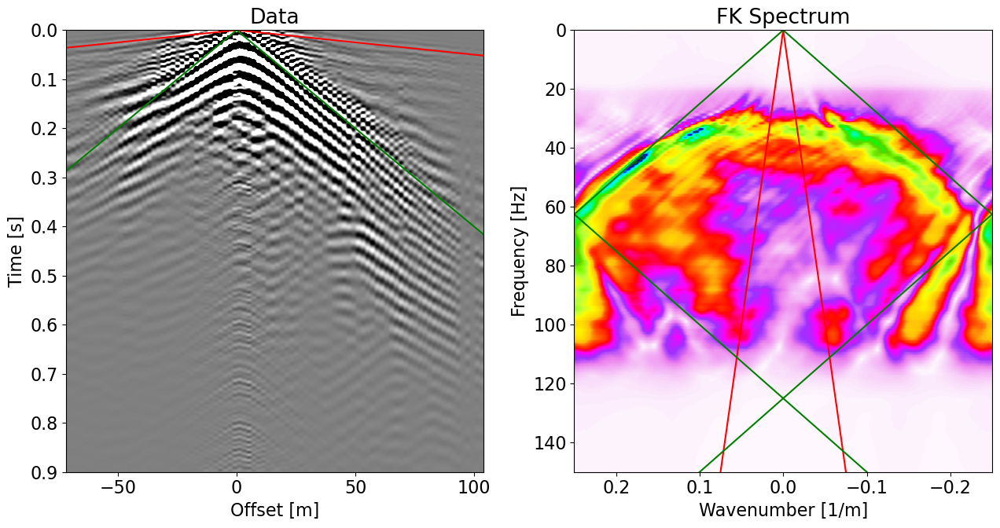

In [ ]:
Dfk = FFTop @ datafilt[ishot, :, :itmax]

fig, axs = plt.subplots(1, 2, figsize=(13, 7))
axs[0].imshow(datafilt[ishot, :-1, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].plot(offset, tdir, 'r')
axs[0].plot(offset, tgr, 'g')
axs[0].axis('tight')
axs[0].set_title('Data')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(np.fft.fftshift(np.abs(Dfk), axes=0).T, cmap='gist_ncar_r',
              extent=(-FFTop.f1[nfft//2], FFTop.f1[nfft//2], FFTop.f2[-1], FFTop.f2[0]))
axs[1].plot(FFTop.f2/vdir, FFTop.f2, 'r'), axs[1].plot(-FFTop.f2/vdir, FFTop.f2, 'r')
axs[1].plot(FFTop.f2/vgr, FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr, FFTop.f2, 'g')
for ireplica in range(1, 2):
    axs[1].plot(FFTop.f2/vgr + 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr - 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g') 
axs[1].axis('tight')
axs[1].set_xlim(-FFTop.f1[nfft//2], FFTop.f1[nfft//2])
axs[1].set_ylim(150, FFTop.f2[0])
axs[1].set_title('FK Spectrum')
axs[1].set_xlabel('Wavenumber [1/m]')
axs[1].set_ylabel('Frequency [Hz]')
plt.tight_layout()
plt.savefig(f"Figs/FKspectrafilt_shot{ishot}.png", dpi=200);